# Курсовой проект студента GeekBrains
# Автор: Ельцов Артем Александрович
# Ник на kaggle: virus_madison
# Задание для курсового проекта

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/gb-credit-default/sample_submission.csv
/kaggle/input/gb-credit-default/train.csv
/kaggle/input/gb-credit-default/test.csv


# Подключение библиотек и скриптов

In [2]:
import pandas as pd
import numpy as np
import pickle
import random
from pathlib import Path

from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score, learning_curve
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score
from sklearn.model_selection import KFold, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

import xgboost as xgb, lightgbm as lgbm, catboost as catb

import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

In [3]:
import warnings
warnings.simplefilter('ignore')

In [4]:
matplotlib.rcParams.update({'font.size': 14})

In [5]:
def get_classification_report(y_train_true, y_train_pred, y_test_true, y_test_pred):
    report = {'train_report': classification_report(y_train_true, y_train_pred), 
              'test_report':classification_report(y_test_true, y_test_pred),
              'crosstab': pd.crosstab(y_test_true, y_test_pred)}
    return report 

In [6]:
def balance_df_by_target(df, target_name):

    target_counts = df[target_name].value_counts()

    major_class_name = target_counts.argmax()
    minor_class_name = target_counts.argmin()

    disbalance_coeff = int(target_counts[major_class_name] / target_counts[minor_class_name]) - 1

    for i in range(disbalance_coeff):
        sample = df[df[target_name] == minor_class_name].sample(target_counts[minor_class_name])
        df = df.append(sample, ignore_index=True)

    return df.sample(frac=1) 

# **Пути к директориям и файлам**

In [7]:
DATA_ROOT = Path('/kaggle/input/gb-credit-default/')

TRAIN_DATASET_PATH = DATA_ROOT / 'train.csv'
TEST_DATASET_PATH = DATA_ROOT / 'test.csv'

# Описание данных
* Home Ownership - Вид домовладения (собственник, ипотека, рента)
* Annual Income - Годовой доход
* Years in current job - Лет на текущей работе
* Tax Liens - Налоговые залоги  
* Number of Open Accounts - Количество открытых счетов
* Years of Credit History - Лет кредитной истории                      
* Maximum Open Credit - Максимальный открытый кредит                        
* Number of Credit Problems - Количество проблем с кредитом                       
* Months since last delinquent - Количество месяцев с момента последнего просрочки платежа                  
* Bankruptcies - Банкротства                                    
* Purpose - Цель кредита                        
* Term - Срок кредита                                  
* Current Loan Amount - Текущая сумма кредита                         
* Current Credit Balance - Текущий кредитный баланс                      
* Monthly Debt - Ежемесячный долг                                 
* Credit Score - Кредитный рейтинг                                  
* Credit Default - Кредитный дефолт                                  


# Загрузка данных

In [8]:
train_df = pd.read_csv(TRAIN_DATASET_PATH, sep=',')
train_df.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0


In [9]:
train_df.shape

(7500, 17)

In [10]:
train_df.iloc[0]

Home Ownership                            Own Home
Annual Income                               482087
Years in current job                           NaN
Tax Liens                                        0
Number of Open Accounts                         11
Years of Credit History                       26.3
Maximum Open Credit                         685960
Number of Credit Problems                        1
Months since last delinquent                   NaN
Bankruptcies                                     1
Purpose                         debt consolidation
Term                                    Short Term
Current Loan Amount                          1e+08
Current Credit Balance                       47386
Monthly Debt                                  7914
Credit Score                                   749
Credit Default                                   0
Name: 0, dtype: object

In [11]:
train_df.dtypes

Home Ownership                   object
Annual Income                   float64
Years in current job             object
Tax Liens                       float64
Number of Open Accounts         float64
Years of Credit History         float64
Maximum Open Credit             float64
Number of Credit Problems       float64
Months since last delinquent    float64
Bankruptcies                    float64
Purpose                          object
Term                             object
Current Loan Amount             float64
Current Credit Balance          float64
Monthly Debt                    float64
Credit Score                    float64
Credit Default                    int64
dtype: object

In [12]:
test_df = pd.read_csv(TEST_DATASET_PATH, sep=',')
test_df.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
0,Rent,NaN,4 years,0.0,9.0,12.5,220968.0,0.0,70.0,0.0,debt consolidation,Short Term,162470.0,105906.0,6813.0,NaN
1,Rent,231838.0,1 year,0.0,6.0,32.7,55946.0,0.0,8.0,0.0,educational expenses,Short Term,78298.0,46037.0,2318.0,699.0
2,Home Mortgage,1152540.0,3 years,0.0,10.0,13.7,204600.0,0.0,NaN,0.0,debt consolidation,Short Term,200178.0,146490.0,18729.0,7260.0
3,Home Mortgage,1220313.0,10+ years,0.0,16.0,17.0,456302.0,0.0,70.0,0.0,debt consolidation,Short Term,217382.0,213199.0,27559.0,739.0
4,Home Mortgage,2340952.0,6 years,0.0,11.0,23.6,1207272.0,0.0,NaN,0.0,debt consolidation,Long Term,777634.0,425391.0,42605.0,706.0


In [13]:
test_df.shape

(2500, 16)

In [14]:
test_df.dtypes

Home Ownership                   object
Annual Income                   float64
Years in current job             object
Tax Liens                       float64
Number of Open Accounts         float64
Years of Credit History         float64
Maximum Open Credit             float64
Number of Credit Problems       float64
Months since last delinquent    float64
Bankruptcies                    float64
Purpose                          object
Term                             object
Current Loan Amount             float64
Current Credit Balance          float64
Monthly Debt                    float64
Credit Score                    float64
dtype: object

С помощью процедуры оптимизатора используемой памяти попробуем уменьшить расход памяти

In [15]:
def memory_compression(df):
    original_mem = df.memory_usage().sum() / 1024**2
    
    for col in df.columns:
        
        if df[col].dtype != object:
            col_min = df[col].min()
            col_max = df[col].max()

            if str(df[col].dtype)[:3] == 'int':
                if col_min > np.iinfo(np.int8).min and col_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif col_min > np.iinfo(np.int16).min and col_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif col_min > np.iinfo(np.int32).min and col_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif col_min > np.iinfo(np.int64).min and col_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            elif str(df[col].dtype)[:5] == 'float':
                if col_min > np.finfo(np.float32).min and col_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')
            
    reduced_mem = df.memory_usage().sum() / 1024**2
    
    print(f'Изначальный размер занимаемой памяти равен {round(original_mem,2)} мб.')
    print(f'Конечный размер занимаемой памяти равен {round(reduced_mem,2)} мб.')

In [16]:
memory_compression(train_df)
memory_compression(test_df)

Изначальный размер занимаемой памяти равен 0.97 мб.
Конечный размер занимаемой памяти равен 0.38 мб.
Изначальный размер занимаемой памяти равен 0.31 мб.
Конечный размер занимаемой памяти равен 0.13 мб.


In [17]:
train_df.shape[1] - 1 == test_df.shape[1]

True

In [18]:
train_df.dtypes

Home Ownership                  category
Annual Income                    float32
Years in current job            category
Tax Liens                        float32
Number of Open Accounts          float32
Years of Credit History          float32
Maximum Open Credit              float32
Number of Credit Problems        float32
Months since last delinquent     float32
Bankruptcies                     float32
Purpose                         category
Term                            category
Current Loan Amount              float32
Current Credit Balance           float32
Monthly Debt                     float32
Credit Score                     float32
Credit Default                      int8
dtype: object

In [19]:
test_df.dtypes

Home Ownership                  category
Annual Income                    float32
Years in current job            category
Tax Liens                        float32
Number of Open Accounts          float32
Years of Credit History          float32
Maximum Open Credit              float32
Number of Credit Problems        float32
Months since last delinquent     float32
Bankruptcies                     float32
Purpose                         category
Term                            category
Current Loan Amount              float32
Current Credit Balance           float32
Monthly Debt                     float32
Credit Score                     float32
dtype: object

# Обзор данных
# Обзор целевой переменной

In [20]:
train_df['Credit Default'].value_counts()

0    5387
1    2113
Name: Credit Default, dtype: int64

# Обзор количественных признаков

In [21]:
train_df.describe()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
count,5.943000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7500.0000,3419.000000,7486.000000,7500.0,7.500000e+03,7500.000000,5943.000000,7500.000000
mean,1.366390e+06,0.030133,11.130934,18.317446,9.451526e+05,0.1700,34.692600,0.117152,11873135.0,2.898332e+05,18314.453125,1151.087524,0.281733
std,8.453384e+05,0.271613,4.908937,7.041938,1.602614e+07,0.4986,21.688801,0.347197,31926302.0,3.178713e+05,11926.758789,1604.447510,0.449874
min,1.645970e+05,0.000000,2.000000,4.000000,0.000000e+00,0.0000,0.000000,0.000000,11242.0,0.000000e+00,0.000000,585.000000,0.000000
25%,8.443410e+05,0.000000,8.000000,13.500000,2.792295e+05,0.0000,16.000000,0.000000,180169.0,1.142565e+05,10067.500000,711.000000,0.000000
50%,1.168386e+06,0.000000,10.000000,17.000000,4.781590e+05,0.0000,32.000000,0.000000,309573.0,2.093230e+05,16076.500000,731.000000,0.000000
75%,1.640137e+06,0.000000,14.000000,21.799999,7.935015e+05,0.0000,50.000000,0.000000,519882.0,3.604062e+05,23818.000000,743.000000,1.000000
max,1.014934e+07,7.000000,43.000000,57.700001,1.304726e+09,7.0000,118.000000,4.000000,100000000.0,6.506797e+06,136679.000000,7510.000000,1.000000


In [22]:
for cat_colname in train_df.select_dtypes(include='category').columns:
    print(str(cat_colname) + '\n\n' + str(train_df[cat_colname].value_counts()) + '\n' + '*' * 100 + '\n')

Home Ownership

Home Mortgage    3637
Rent             3204
Own Home          647
Have Mortgage      12
Name: Home Ownership, dtype: int64
****************************************************************************************************

Years in current job

10+ years    2332
2 years       705
3 years       620
< 1 year      563
5 years       516
1 year        504
4 years       469
6 years       426
7 years       396
8 years       339
9 years       259
Name: Years in current job, dtype: int64
****************************************************************************************************

Purpose

debt consolidation      5944
other                    665
home improvements        412
business loan            129
buy a car                 96
medical bills             71
major purchase            40
take a trip               37
buy house                 34
small business            26
wedding                   15
moving                    11
educational expenses      10
vacation  

# 1. EDA
# Делаем EDA для:
* Исправления выбросов
* Заполнения NaN
* Идей для генерации новых фич
* Целевая переменная

# Выделение признакового описания и целевой переменной и групп признаков

In [23]:
TARGET_NAME = 'Credit Default'

# Удалим целевую переменную из тренировочного списка признков и получи список без него
BASE_FEATURE_NAMES = train_df.columns.drop(TARGET_NAME).tolist()
NEW_FEATURE_NAMES = train_df.columns.drop([TARGET_NAME] + BASE_FEATURE_NAMES).tolist()

In [24]:
# Вещественные признаки
NUM_FEATURE_NAMES = ['Annual Income','Tax Liens','Number of Open Accounts','Years of Credit History','Maximum Open Credit',
                     'Number of Credit Problems','Months since last delinquent','Bankruptcies','Current Loan Amount',
                     'Current Credit Balance','Monthly Debt','Credit Score']

# Категориальные признаки
CAT_FEATURE_NAMES = ['Home Ownership','Years in current job','Purpose','Term']

SELECTED_FEATURE_NAMES = NUM_FEATURE_NAMES + CAT_FEATURE_NAMES + NEW_FEATURE_NAMES

In [25]:
#'Have Mortgage' явно одно и тоже что и 'Have Mortgage'  по этому объъединим их в одно значение
condition = (train_df['Home Ownership'] == 'Have Mortgage')
train_df.loc[condition, 'Home Ownership'] = 'Home Mortgage'

condition = (test_df['Home Ownership'] == 'Have Mortgage')
test_df.loc[condition, 'Home Ownership'] = 'Home Mortgage'

# Перевод в порядковые числа категориальных признаков

In [26]:
le = LabelEncoder()
train_df['Home Ownership'] = le.fit_transform(train_df['Home Ownership'])
test_df['Home Ownership'] = le.transform(test_df['Home Ownership'])

train_df['Home Ownership'].value_counts()

0    3649
2    3204
1     647
Name: Home Ownership, dtype: int64

In [27]:
le = LabelEncoder()
train_df['Purpose'] = le.fit_transform(train_df['Purpose'])
test_df['Purpose'] = le.transform(test_df['Purpose'])

train_df['Purpose'].value_counts()

3     5944
9      665
5      412
0      129
1       96
7       71
6       40
12      37
2       34
11      26
14      15
8       11
4       10
13       8
10       2
Name: Purpose, dtype: int64

In [28]:
le = LabelEncoder()
train_df['Term'] = le.fit_transform(train_df['Term'])
test_df['Term'] = le.transform(test_df['Term'])

train_df['Term'].value_counts()

1    5556
0    1944
Name: Term, dtype: int64

In [29]:
dct = {'< 1 year': 0, '1 year': 1, '2 years': 2, '3 years': 3, '4 years': 4, '5 years': 5,
      '6 years': 6, '7 years': 7, '8 years': 8, '9 years': 9, '10+ years': 10}
train_df['Years in current job'] = train_df['Years in current job'].map(dct)
test_df['Years in current job'] = test_df['Years in current job'].map(dct)
train_df['Years in current job'].value_counts()

10    2332
2      705
3      620
0      563
5      516
1      504
4      469
6      426
7      396
8      339
9      259
Name: Years in current job, dtype: int64

# Заполнение пропусков/выбросов

In [30]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.preprocessing import StandardScaler


def imputer_rfr(data, target_col, n_est, m_depth, r_state, verb, max_feat, min_sampl):
    data = data.copy()
    
    features = data.columns
    
    data = data[features]
    
    train = data[~data[target_col].isna()]
    predict_data = data[data[target_col].isna()]

    X = train.drop(columns=target_col)
    y = train[target_col]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.2,
                                                        shuffle=True,
                                                        random_state=21)
    
    model = RandomForestRegressor(n_estimators=n_est,
                                  max_depth=m_depth,
                                  random_state=r_state,
                                  verbose=verb,
                                  max_features=max_feat,
                                  min_samples_leaf=min_sampl)
    model.fit(X_train, y_train)
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    print(f"r2 на train: {r2_score(y_train, pred_train)}")
    print(f"r2 на test: {r2_score(y_test, pred_test)}")

    pred = model.predict(predict_data.drop(columns=target_col))

    data.loc[data[target_col].isna(), target_col] = list(pred)
    return model, data

In [31]:
train_df_copy = train_df.copy()
test_df_copy = test_df.copy()

In [32]:
len(train_df) - train_df.count()

Home Ownership                     0
Annual Income                   1557
Years in current job             371
Tax Liens                          0
Number of Open Accounts            0
Years of Credit History            0
Maximum Open Credit                0
Number of Credit Problems          0
Months since last delinquent    4081
Bankruptcies                      14
Purpose                            0
Term                               0
Current Loan Amount                0
Current Credit Balance             0
Monthly Debt                       0
Credit Score                    1557
Credit Default                     0
dtype: int64

In [33]:
len(test_df) - test_df.count()

Home Ownership                     0
Annual Income                    513
Years in current job              86
Tax Liens                          0
Number of Open Accounts            0
Years of Credit History            0
Maximum Open Credit                0
Number of Credit Problems          0
Months since last delinquent    1358
Bankruptcies                       3
Purpose                            0
Term                               0
Current Loan Amount                0
Current Credit Balance             0
Monthly Debt                       0
Credit Score                     513
dtype: int64

In [34]:
train_df_copy.isna().sum().sum()

7580

In [35]:
test_df_copy.isna().sum().sum()

2473

In [36]:
# Функция по обработке выбросов
def preprocess_outlier(df, col, threshold):
    # можно по threshold отсекать, а можно и по квантилям
    df.loc[df[col] > threshold, col] = np.nan
    return df

# Annual Income

In [37]:
feature_name = 'Annual Income'
vrem_train_df_annual_income = train_df_copy[['Home Ownership','Annual Income', 'Tax Liens','Number of Open Accounts','Years of Credit History',
                         'Maximum Open Credit','Number of Credit Problems','Purpose', 'Term',
                         'Current Loan Amount','Current Credit Balance','Monthly Debt']]

In [38]:
%%time
annual_income_predictor, vrem_train_df_annual_income = imputer_rfr(vrem_train_df_annual_income, feature_name, n_est=100, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.770346406680223
r2 на test: 0.4108989447508774
CPU times: user 2.38 s, sys: 10.2 ms, total: 2.39 s
Wall time: 2.39 s


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


In [39]:
vrem_test_df_annual_income = test_df_copy[['Home Ownership','Annual Income', 'Tax Liens','Number of Open Accounts','Years of Credit History',
                         'Maximum Open Credit','Number of Credit Problems','Purpose', 'Term',
                         'Current Loan Amount','Current Credit Balance','Monthly Debt']]

In [40]:
%%time
annual_income_predictor, vrem_test_df_annual_income = imputer_rfr(vrem_test_df_annual_income, feature_name, n_est=70, m_depth=15,
                                                    r_state=21, verb=1,max_feat=4, min_sampl=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.6755029967861925
r2 на test: 0.2123971336662105
CPU times: user 329 ms, sys: 1.96 ms, total: 331 ms
Wall time: 332 ms


[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:    0.0s finished


In [41]:
condition = (train_df_copy['Annual Income'].isna())
train_df_copy.loc[condition, 'Annual Income'] = vrem_train_df_annual_income.loc[condition, 'Annual Income']

In [42]:
condition = (test_df_copy['Annual Income'].isna())
test_df_copy.loc[condition, 'Annual Income'] = vrem_test_df_annual_income.loc[condition, 'Annual Income']

# Years in current job

In [43]:
condition = (train_df_copy['Years in current job'].isna())
train_df_copy.loc[condition, 'Years in current job'] = train_df_copy['Years in current job'].mode()[0]

In [44]:
condition = (test_df_copy['Years in current job'].isna())
test_df_copy.loc[condition, 'Years in current job'] = test_df_copy['Years in current job'].mode()[0]

# Months since last delinquent

In [45]:
feature_name = 'Months since last delinquent'
vrem_train_df_months_since = train_df_copy[['Months since last delinquent', 'Years in current job','Home Ownership','Annual Income', 'Tax Liens','Number of Open Accounts','Years of Credit History',
                         'Maximum Open Credit','Number of Credit Problems','Purpose', 'Term',
                         'Current Loan Amount','Current Credit Balance','Monthly Debt']]

In [46]:
%%time
months_sinc_predictor, vrem_train_df_months_since = imputer_rfr(vrem_train_df_months_since, feature_name, n_est=200, m_depth=20, r_state=21, verb=1,
                                                    max_feat=3, min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.7009174016780901
r2 на test: 0.0027969960650086056
CPU times: user 1.49 s, sys: 9.81 ms, total: 1.5 s
Wall time: 1.5 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


In [47]:
vrem_test_df_months_since = test_df_copy[['Months since last delinquent', 'Years in current job','Home Ownership','Annual Income', 'Tax Liens','Number of Open Accounts','Years of Credit History',
                         'Maximum Open Credit','Number of Credit Problems','Purpose', 'Term',
                         'Current Loan Amount','Current Credit Balance','Monthly Debt']]

In [48]:
%%time
months_sinc_predictor, vrem_test_df_months_since = imputer_rfr(vrem_test_df_months_since, feature_name, n_est=200, m_depth=20, r_state=21, verb=1,
                                                    max_feat=3, min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.719887279197119
r2 на test: 0.010468112078581893
CPU times: user 707 ms, sys: 9.17 ms, total: 716 ms
Wall time: 711 ms


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [49]:
condition = (train_df_copy['Months since last delinquent'].isna())
train_df_copy.loc[condition, 'Months since last delinquent'] = vrem_train_df_months_since.loc[condition, 'Months since last delinquent']

In [50]:
condition = (test_df_copy['Months since last delinquent'].isna())
test_df_copy.loc[condition, 'Months since last delinquent'] = vrem_test_df_months_since.loc[condition, 'Months since last delinquent']

# Bankruptcies

In [51]:
feature_name = 'Bankruptcies'
vrem_train_df_bankruptcies = train_df_copy[['Bankruptcies','Months since last delinquent', 'Years in current job','Home Ownership','Annual Income', 'Tax Liens','Number of Open Accounts','Years of Credit History',
                         'Maximum Open Credit','Number of Credit Problems','Purpose', 'Term',
                         'Current Loan Amount','Current Credit Balance','Monthly Debt']]

In [52]:
%%time
bankruptcies_predictor, vrem_train_df_bankruptcies = imputer_rfr(vrem_train_df_bankruptcies, feature_name, n_est=200, m_depth=10, r_state=21, verb=1,
                                                    max_feat=8, min_sampl=21)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.817170063546272
r2 на test: 0.8021980772114621
CPU times: user 1.35 s, sys: 12.1 ms, total: 1.37 s
Wall time: 1.36 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [53]:
vrem_test_df_bankruptcies = test_df_copy[['Bankruptcies','Months since last delinquent', 'Years in current job','Home Ownership','Annual Income', 'Tax Liens','Number of Open Accounts','Years of Credit History',
                         'Maximum Open Credit','Number of Credit Problems','Purpose', 'Term',
                         'Current Loan Amount','Current Credit Balance','Monthly Debt']]

In [54]:
%%time
bankruptcies_predictor, vrem_test_df_bankruptcies = imputer_rfr(vrem_test_df_bankruptcies, feature_name, n_est=200, m_depth=10, r_state=21, verb=1,
                                                    max_feat=6, min_sampl=4)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.8213919097324074
r2 на test: 0.7945454679982898
CPU times: user 668 ms, sys: 11 ms, total: 679 ms
Wall time: 672 ms


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [55]:
condition = (train_df_copy['Bankruptcies'].isna())
train_df_copy.loc[condition, 'Bankruptcies'] = vrem_train_df_bankruptcies.loc[condition, 'Bankruptcies']

In [56]:
condition = (test_df_copy['Bankruptcies'].isna())
test_df_copy.loc[condition, 'Bankruptcies'] = vrem_test_df_bankruptcies.loc[condition, 'Bankruptcies']

# Credit Score

In [57]:
feature_name = 'Credit Score'
vrem_train_df_credit_score = train_df_copy[['Credit Score','Bankruptcies','Months since last delinquent', 'Years in current job','Home Ownership','Annual Income', 'Tax Liens','Number of Open Accounts','Years of Credit History',
                         'Maximum Open Credit','Number of Credit Problems','Purpose', 'Term',
                         'Current Loan Amount','Current Credit Balance','Monthly Debt']]

In [58]:
%%time
credit_score_predictor, vrem_train_df_credit_score = imputer_rfr(vrem_train_df_credit_score, feature_name, n_est=500, m_depth=10, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   12.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.29350011067862747
r2 на test: 0.004239563145831515
CPU times: user 12.8 s, sys: 14.8 ms, total: 12.8 s
Wall time: 12.8 s


[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


In [59]:
vrem_test_df_credit_score = test_df_copy[['Credit Score','Bankruptcies','Months since last delinquent', 'Years in current job','Home Ownership','Annual Income', 'Tax Liens','Number of Open Accounts','Years of Credit History',
                         'Maximum Open Credit','Number of Credit Problems','Purpose', 'Term',
                         'Current Loan Amount','Current Credit Balance','Monthly Debt']]

In [60]:
%%time
credit_score_predictor, vrem_test_df_credit_score = imputer_rfr(vrem_test_df_credit_score, feature_name, n_est=200, m_depth=8, r_state=21, verb=1,
                                                    max_feat=2, min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.25945540134945255
r2 на test: 0.007635566594151211
CPU times: user 617 ms, sys: 5.98 ms, total: 623 ms
Wall time: 623 ms


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [61]:
condition = (train_df_copy['Credit Score'].isna())
train_df_copy.loc[condition, 'Credit Score'] = vrem_train_df_credit_score.loc[condition, 'Credit Score']

In [62]:
condition = (test_df_copy['Credit Score'].isna())
test_df_copy.loc[condition, 'Credit Score'] = vrem_test_df_credit_score.loc[condition, 'Credit Score']

In [63]:
len(train_df_copy) - train_df_copy.count()

Home Ownership                  0
Annual Income                   0
Years in current job            0
Tax Liens                       0
Number of Open Accounts         0
Years of Credit History         0
Maximum Open Credit             0
Number of Credit Problems       0
Months since last delinquent    0
Bankruptcies                    0
Purpose                         0
Term                            0
Current Loan Amount             0
Current Credit Balance          0
Monthly Debt                    0
Credit Score                    0
Credit Default                  0
dtype: int64

In [64]:
len(test_df_copy) - test_df_copy.count()

Home Ownership                  0
Annual Income                   0
Years in current job            0
Tax Liens                       0
Number of Open Accounts         0
Years of Credit History         0
Maximum Open Credit             0
Number of Credit Problems       0
Months since last delinquent    0
Bankruptcies                    0
Purpose                         0
Term                            0
Current Loan Amount             0
Current Credit Balance          0
Monthly Debt                    0
Credit Score                    0
dtype: int64

# Перенесем данные из копий в df

In [65]:
condition = (train_df['Annual Income'].isna())
train_df.loc[condition, 'Annual Income'] = train_df_copy.loc[condition, 'Annual Income']

condition = (train_df['Years in current job'].isna())
train_df.loc[condition, 'Years in current job'] = train_df['Years in current job'].mode()[0]

condition = (train_df['Months since last delinquent'].isna())
train_df.loc[condition, 'Months since last delinquent'] = train_df_copy.loc[condition, 'Months since last delinquent']

condition = (train_df['Bankruptcies'].isna())
train_df.loc[condition, 'Bankruptcies'] = train_df_copy.loc[condition, 'Bankruptcies']

condition = (train_df['Credit Score'].isna())
train_df.loc[condition, 'Credit Score'] = train_df_copy.loc[condition, 'Credit Score']

In [66]:
condition = (test_df['Annual Income'].isna())
test_df.loc[condition, 'Annual Income'] = test_df_copy.loc[condition, 'Annual Income']

condition = (test_df['Years in current job'].isna())
test_df.loc[condition, 'Years in current job'] = test_df['Years in current job'].mode()[0]

condition = (test_df['Months since last delinquent'].isna())
test_df.loc[condition, 'Months since last delinquent'] = test_df_copy.loc[condition, 'Months since last delinquent']

condition = (test_df['Bankruptcies'].isna())
test_df.loc[condition, 'Bankruptcies'] = test_df_copy.loc[condition, 'Bankruptcies']

condition = (test_df['Credit Score'].isna())
test_df.loc[condition, 'Credit Score'] = test_df_copy.loc[condition, 'Credit Score']

# Заполнение выбросов

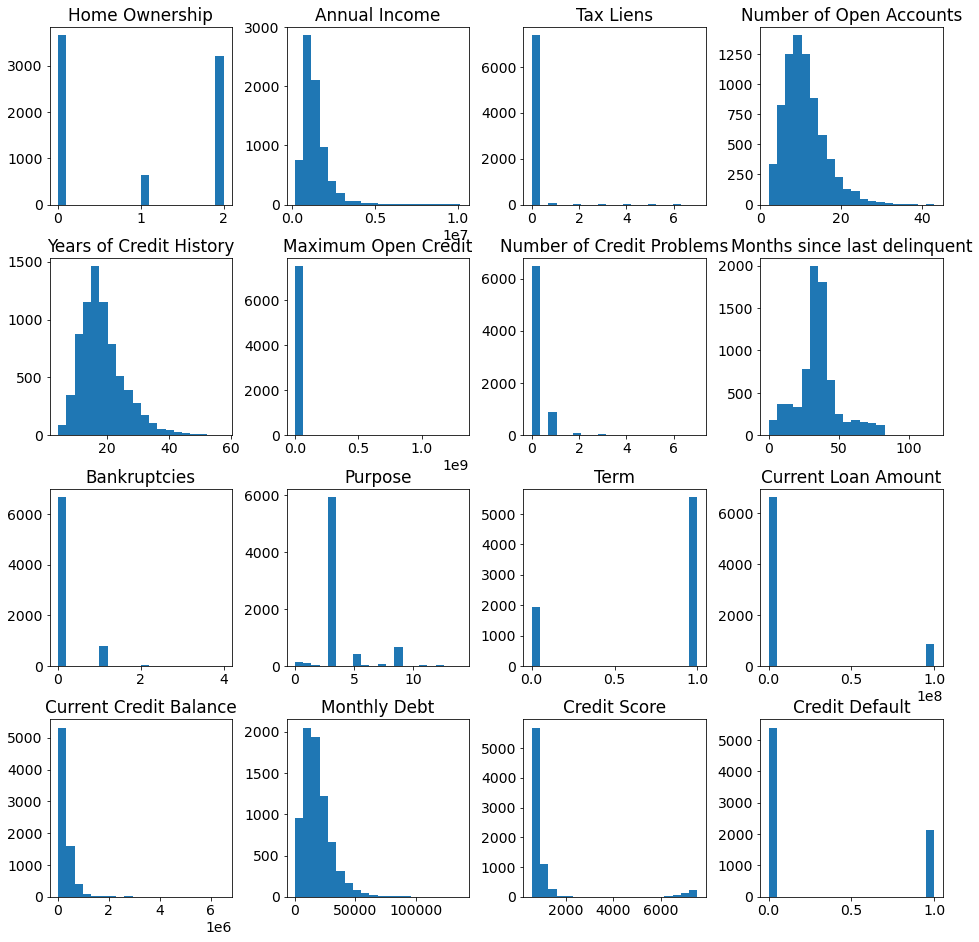

In [67]:
train_df.hist(figsize=(16,16), bins=20, grid=False);

In [68]:
train_df.describe()

,Home Ownership,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
count,7500.000000,7.500000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7500.0000,7500.000000,7500.000000,7500.000000,7500.000000,7500.0,7.500000e+03,7500.000000,7500.000000,7500.000000
mean,0.940667,1.366008e+06,0.030133,11.130934,18.317446,9.451526e+05,0.1700,35.066700,0.116937,3.729333,0.740800,11873135.0,2.898332e+05,18314.453125,1155.186035,0.281733
std,0.954114,7.991679e+05,0.271613,4.908937,7.041938,1.602614e+07,0.4986,15.088398,0.346899,2.076435,0.438225,31926302.0,3.178713e+05,11926.758789,1431.646484,0.449874
min,0.000000,1.645970e+05,0.000000,2.000000,4.000000,0.000000e+00,0.0000,0.000000,0.000000,0.000000,0.000000,11242.0,0.000000e+00,0.000000,585.000000,0.000000
25%,0.000000,8.700005e+05,0.000000,8.000000,13.500000,2.792295e+05,0.0000,28.962017,0.000000,3.000000,0.000000,180169.0,1.142565e+05,10067.500000,718.000000,0.000000
50%,1.000000,1.194449e+06,0.000000,10.000000,17.000000,4.781590e+05,0.0000,34.736164,0.000000,3.000000,1.000000,309573.0,2.093230e+05,16076.500000,738.000000,0.000000
75%,2.000000,1.634003e+06,0.000000,14.000000,21.799999,7.935015e+05,0.0000,40.380999,0.000000,3.000000,1.000000,519882.0,3.604062e+05,23818.000000,907.019165,1.000000
max,2.000000,1.014934e+07,7.000000,43.000000,57.700001,1.304726e+09,7.0000,118.000000,4.000000,14.000000,1.000000,100000000.0,6.506797e+06,136679.000000,7510.000000,1.000000


In [69]:
train_df['Credit Score'].quantile(.975), train_df['Credit Score'].quantile(.025)

(7215.249999999996, 653.0)

In [70]:
df_copy = train_df.copy()
df_test_copy = test_df.copy()

# Annual Income

In [71]:
feature_name = 'Annual Income'
train_df = preprocess_outlier(train_df, feature_name, threshold=train_df['Annual Income'].quantile(.975))
test_df = preprocess_outlier(test_df, feature_name, threshold=test_df['Annual Income'].quantile(.975))

train_df[feature_name].isna().sum()

188

In [72]:
df_copy = train_df.copy()
df_test_copy = test_df.copy()

In [73]:
%%time
annual_income_predictor, df_copy = imputer_rfr(df_copy, feature_name, n_est=200, m_depth=5, r_state=21, verb=1,
                                                    max_feat=10, min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.5339636677594403
r2 на test: 0.5399061402045245
CPU times: user 2.38 s, sys: 9.91 ms, total: 2.39 s
Wall time: 2.39 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [74]:
%%time
annual_income_predictor, df_test_copy = imputer_rfr(df_test_copy, feature_name, n_est=200, m_depth=5, r_state=21, verb=1,
                                                    max_feat=10, min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.5934902105085638
r2 на test: 0.4446735258299117
CPU times: user 1.05 s, sys: 5.04 ms, total: 1.06 s
Wall time: 1.05 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [75]:
condition = (train_df['Annual Income'].isna())
train_df.loc[condition, 'Annual Income'] = df_copy.loc[condition, 'Annual Income']

In [76]:
condition = (test_df['Annual Income'].isna())
test_df.loc[condition, 'Annual Income'] = df_test_copy.loc[condition, 'Annual Income']

# Number of Open Accounts

In [77]:
feature_name = 'Number of Open Accounts'
train_df = preprocess_outlier(train_df, feature_name, threshold=train_df['Number of Open Accounts'].quantile(.975))
test_df = preprocess_outlier(test_df, feature_name, threshold=test_df['Number of Open Accounts'].quantile(.975))

train_df[feature_name].isna().sum()

170

In [78]:
df_copy = train_df.copy()
df_test_copy = test_df.copy()

In [79]:
%%time
num_open_predictor, df_copy = imputer_rfr(df_copy, feature_name, n_est=500, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=7)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   15.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.6567390039468413
r2 на test: 0.32256260736267606
CPU times: user 16.6 s, sys: 42.5 ms, total: 16.7 s
Wall time: 16.7 s


[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


In [80]:
%%time
num_open_predictor, df_test_copy = imputer_rfr(df_test_copy, feature_name, n_est=500, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=7)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    4.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.6577899119679238
r2 на test: 0.35455278206439556
CPU times: user 5.03 s, sys: 15.1 ms, total: 5.04 s
Wall time: 5.04 s


[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


In [81]:
condition = (train_df['Number of Open Accounts'].isna())
train_df.loc[condition, 'Number of Open Accounts'] = df_copy.loc[condition, 'Number of Open Accounts']

In [82]:
condition = (test_df['Number of Open Accounts'].isna())
test_df.loc[condition, 'Number of Open Accounts'] = df_test_copy.loc[condition, 'Number of Open Accounts']

# Years of Credit History

In [83]:
feature_name = 'Years of Credit History'
train_df = preprocess_outlier(train_df, feature_name, threshold=train_df['Years of Credit History'].quantile(.975))
test_df = preprocess_outlier(test_df, feature_name, threshold=test_df['Years of Credit History'].quantile(.975))

train_df[feature_name].isna().sum()

186

In [84]:
df_copy = train_df.copy()
df_test_copy = test_df.copy()

In [85]:
%%time
years_credit_predictor, df_copy = imputer_rfr(df_copy, feature_name, n_est=200, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    7.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.7787627806552432
r2 на test: 0.17499193853206652
CPU times: user 7.86 s, sys: 20.9 ms, total: 7.88 s
Wall time: 7.88 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [86]:
%%time
years_credit_predictor, df_test_copy = imputer_rfr(df_test_copy, feature_name, n_est=500, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.8263390405715104
r2 на test: 0.15196865797688064
CPU times: user 6.33 s, sys: 18.9 ms, total: 6.34 s
Wall time: 6.34 s


[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.0s finished


In [87]:
condition = (train_df['Years of Credit History'].isna())
train_df.loc[condition, 'Years of Credit History'] = df_copy.loc[condition, 'Years of Credit History']

In [88]:
condition = (test_df['Years of Credit History'].isna())
test_df.loc[condition, 'Years of Credit History'] = df_test_copy.loc[condition, 'Years of Credit History']

# Maximum Open Credit

In [89]:
feature_name = 'Maximum Open Credit'
train_df = preprocess_outlier(train_df, feature_name, threshold=train_df['Maximum Open Credit'].quantile(.975))
test_df = preprocess_outlier(test_df, feature_name, threshold=test_df['Maximum Open Credit'].quantile(.975))

train_df[feature_name].isna().sum()

188

In [90]:
df_copy = train_df.copy()
df_test_copy = test_df.copy()

In [91]:
%%time
years_credit_predictor, df_copy = imputer_rfr(df_copy, feature_name, n_est=200, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    7.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.9228134680518544
r2 на test: 0.6615998405252735
CPU times: user 7.64 s, sys: 27.9 ms, total: 7.67 s
Wall time: 7.67 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [92]:
%%time
years_credit_predictor, df_test_copy = imputer_rfr(df_test_copy, feature_name, n_est=200, m_depth=5, r_state=21, verb=1,
                                                    max_feat=10, min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.6789965821111514
r2 на test: 0.6137403764739151
CPU times: user 1.07 s, sys: 6.05 ms, total: 1.08 s
Wall time: 1.07 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [93]:
condition = (train_df['Maximum Open Credit'].isna())
train_df.loc[condition, 'Maximum Open Credit'] = df_copy.loc[condition, 'Maximum Open Credit']

In [94]:
condition = (test_df['Maximum Open Credit'].isna())
test_df.loc[condition, 'Maximum Open Credit'] = df_test_copy.loc[condition, 'Maximum Open Credit']

# Current Credit Balance

In [95]:
feature_name = 'Current Credit Balance'
train_df = preprocess_outlier(train_df, feature_name, threshold=train_df['Current Credit Balance'].quantile(.975))
test_df = preprocess_outlier(test_df, feature_name, threshold=test_df['Current Credit Balance'].quantile(.975))

train_df[feature_name].isna().sum()

188

In [96]:
df_copy = train_df.copy()
df_test_copy = test_df.copy()

In [97]:
%%time
credit_balance_predictor, df_copy = imputer_rfr(df_copy, feature_name, n_est=200, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    7.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.9323654879678807
r2 на test: 0.7046501815641735
CPU times: user 7.55 s, sys: 15.9 ms, total: 7.57 s
Wall time: 7.56 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [98]:
%%time
credit_balance_predictor, df_test_copy = imputer_rfr(df_test_copy, feature_name, n_est=200, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.9360652397245399
r2 на test: 0.6602961112637449
CPU times: user 2.42 s, sys: 5.98 ms, total: 2.42 s
Wall time: 2.43 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [99]:
condition = (train_df['Current Credit Balance'].isna())
train_df.loc[condition, 'Current Credit Balance'] = df_copy.loc[condition, 'Current Credit Balance']

In [100]:
condition = (test_df['Current Credit Balance'].isna())
test_df.loc[condition, 'Current Credit Balance'] = df_test_copy.loc[condition, 'Current Credit Balance']

# Monthly Debt

In [101]:
feature_name = 'Monthly Debt'
train_df = preprocess_outlier(train_df, feature_name, threshold=train_df['Monthly Debt'].quantile(.975))
test_df = preprocess_outlier(test_df, feature_name, threshold=test_df['Monthly Debt'].quantile(.975))

train_df[feature_name].isna().sum()

188

In [102]:
df_copy = train_df.copy()
df_test_copy = test_df.copy()

In [103]:
%%time
monthly_debt_predictor, df_copy = imputer_rfr(df_copy, feature_name, n_est=200, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    7.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.8976524505325374
r2 на test: 0.5723174387702674
CPU times: user 7.54 s, sys: 15 ms, total: 7.55 s
Wall time: 7.55 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [104]:
%%time
monthly_debt_predictor, df_test_copy = imputer_rfr(df_test_copy, feature_name, n_est=200, m_depth=15, r_state=21, verb=1,
                                                    max_feat='auto', min_sampl=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


r2 на train: 0.9120412900159914
r2 на test: 0.5843236572822323
CPU times: user 2.39 s, sys: 16 ms, total: 2.41 s
Wall time: 2.4 s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


In [105]:
condition = (train_df['Monthly Debt'].isna())
train_df.loc[condition, 'Monthly Debt'] = df_copy.loc[condition, 'Monthly Debt']

In [106]:
condition = (test_df['Monthly Debt'].isna())
test_df.loc[condition, 'Monthly Debt'] = df_test_copy.loc[condition, 'Monthly Debt']

# Генерация фичей

In [107]:
import featuretools as ft
import featuretools.variable_types as vtypes

TRAIN

In [108]:
# creating and entity set 'es'
es = ft.EntitySet(id='Credits')
es

Entityset: Credits
  Entities:
  Relationships:
    No relationships

In [109]:
train_df['Id'] = train_df.index
test_df['Id'] = test_df.index

In [110]:
features = ['Home Ownership',
 'Annual Income',
 'Years in current job',
 'Tax Liens',
 'Number of Open Accounts',
 'Years of Credit History',
 'Maximum Open Credit',
 'Number of Credit Problems',
 'Months since last delinquent',
 'Bankruptcies',
 'Purpose',
 'Term',
 'Current Loan Amount',
 'Current Credit Balance',
 'Monthly Debt',
 'Credit Score']

In [111]:
variable_types = {
    'Home Ownership': vtypes.Categorical,
    'Purpose': vtypes.Categorical,
    'Term': vtypes.Categorical,
    'Years in current job': vtypes.Categorical
}

es.entity_from_dataframe(entity_id='Clients',
                         dataframe=train_df[features],
                         index='Id',
                         variable_types=variable_types)

Entityset: Credits
  Entities:
    Clients [Rows: 7500, Columns: 17]
  Relationships:
    No relationships

In [112]:
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Annual Income', index='Annual Income')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Home Ownership', index='Home Ownership')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Years in current job', index='Years in current job')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Tax Liens', index='Tax Liens')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Number of Open Accounts', index='Number of Open Accounts')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Years of Credit History', index='Years of Credit History')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Maximum Open Credit', index='Maximum Open Credit')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Number of Credit Problems', index='Number of Credit Problems')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Months since last delinquent', index='Months since last delinquent')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Bankruptcies', index='Bankruptcies')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Purpose', index='Purpose')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Term', index='Term')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Current Loan Amount', index='Current Loan Amount')                        
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Current Credit Balance', index='Current Credit Balance')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Monthly Debt', index='Monthly Debt')
es = es.normalize_entity(base_entity_id='Clients', new_entity_id='Credit Score', index='Credit Score')

es

Entityset: Credits
  Entities:
    Clients [Rows: 7500, Columns: 17]
    Annual Income [Rows: 7036, Columns: 1]
    Home Ownership [Rows: 3, Columns: 1]
    Years in current job [Rows: 11, Columns: 1]
    Tax Liens [Rows: 8, Columns: 1]
    Number of Open Accounts [Rows: 192, Columns: 1]
    Years of Credit History [Rows: 494, Columns: 1]
    Maximum Open Credit [Rows: 6964, Columns: 1]
    Number of Credit Problems [Rows: 8, Columns: 1]
    Months since last delinquent [Rows: 4170, Columns: 1]
    Bankruptcies [Rows: 17, Columns: 1]
    Purpose [Rows: 15, Columns: 1]
    Term [Rows: 2, Columns: 1]
    Current Loan Amount [Rows: 5386, Columns: 1]
    Current Credit Balance [Rows: 6592, Columns: 1]
    Monthly Debt [Rows: 6717, Columns: 1]
    Credit Score [Rows: 1825, Columns: 1]
  Relationships:
    Clients.Annual Income -> Annual Income.Annual Income
    Clients.Home Ownership -> Home Ownership.Home Ownership
    Clients.Years in current job -> Years in current job.Years in current j

In [113]:
%%time
feature_matrix, feature_names = ft.dfs(entityset=es, 
                                       target_entity='Clients',
                                       verbose=3)

Built 512 features
Elapsed: 02:29 | Progress: 100%|██████████
CPU times: user 2min 29s, sys: 314 ms, total: 2min 30s
Wall time: 2min 29s


In [114]:
feature_matrix_enc, features_enc = ft.encode_features(feature_matrix, feature_names, include_unknown=False)

In [115]:
train_featured = feature_matrix_enc.copy()
train_featured.shape

(7500, 1970)

In [116]:
train_df = pd.concat([train_df, train_featured],axis=1)

# TEST

In [117]:
es_tst = ft.EntitySet(id='Credits')

es_tst.entity_from_dataframe(entity_id='Clients',
                             dataframe=test_df[features],
                             index='Id')

es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Annual Income', index='Annual Income')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Home Ownership', index='Home Ownership')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Years in current job', index='Years in current job')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Tax Liens', index='Tax Liens')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Number of Open Accounts', index='Number of Open Accounts')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Years of Credit History', index='Years of Credit History')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Maximum Open Credit', index='Maximum Open Credit')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Number of Credit Problems', index='Number of Credit Problems')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Months since last delinquent', index='Months since last delinquent')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Bankruptcies', index='Bankruptcies')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Purpose', index='Purpose')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Term', index='Term')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Current Loan Amount', index='Current Loan Amount')                        
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Current Credit Balance', index='Current Credit Balance')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Monthly Debt', index='Monthly Debt')
es_tst = es_tst.normalize_entity(base_entity_id='Clients', new_entity_id='Credit Score', index='Credit Score')

es_tst

Entityset: Credits
  Entities:
    Clients [Rows: 2500, Columns: 17]
    Annual Income [Rows: 2442, Columns: 1]
    Home Ownership [Rows: 3, Columns: 1]
    Years in current job [Rows: 11, Columns: 1]
    Tax Liens [Rows: 8, Columns: 1]
    Number of Open Accounts [Rows: 85, Columns: 1]
    Years of Credit History [Rows: 368, Columns: 1]
    Maximum Open Credit [Rows: 2435, Columns: 1]
    Number of Credit Problems [Rows: 8, Columns: 1]
    Months since last delinquent [Rows: 1440, Columns: 1]
    Bankruptcies [Rows: 9, Columns: 1]
    Purpose [Rows: 14, Columns: 1]
    Term [Rows: 2, Columns: 1]
    Current Loan Amount [Rows: 2026, Columns: 1]
    Current Credit Balance [Rows: 2385, Columns: 1]
    Monthly Debt [Rows: 2416, Columns: 1]
    Credit Score [Rows: 723, Columns: 1]
  Relationships:
    Clients.Annual Income -> Annual Income.Annual Income
    Clients.Home Ownership -> Home Ownership.Home Ownership
    Clients.Years in current job -> Years in current job.Years in current job


In [118]:
%%time
test_featured = ft.calculate_feature_matrix(features=features_enc, entityset=es_tst)
test_featured

CPU times: user 56.5 s, sys: 127 ms, total: 56.6 s
Wall time: 56.5 s


,Annual Income = 1338113.0,Annual Income = 1161660.0,Annual Income = 1058376.0,Annual Income = 1043651.0,Annual Income = 969475.0,Annual Income = 2293908.0,Annual Income = 1912920.0,Annual Income = 1547512.0,Annual Income = 1508600.0,Annual Income = 1496288.0,...,Credit Score.NUM_UNIQUE(Clients.Maximum Open Credit),Credit Score.NUM_UNIQUE(Clients.Monthly Debt),Credit Score.NUM_UNIQUE(Clients.Months since last delinquent),Credit Score.NUM_UNIQUE(Clients.Number of Credit Problems),Credit Score.NUM_UNIQUE(Clients.Number of Open Accounts),Credit Score.NUM_UNIQUE(Clients.Purpose),Credit Score.NUM_UNIQUE(Clients.Tax Liens),Credit Score.NUM_UNIQUE(Clients.Term),Credit Score.NUM_UNIQUE(Clients.Years in current job),Credit Score.NUM_UNIQUE(Clients.Years of Credit History)
Id,,,,,,,,,,,,,,,,,,,,,
0,False,False,False,False,False,False,False,False,False,False,...,1.0,1.0,1.0,1.0,1.0,1,1.0,1,1,1.0
1,False,False,False,False,False,False,False,False,False,False,...,11.0,11.0,11.0,2.0,9.0,4,2.0,2,7,11.0
2,False,False,False,False,False,False,False,False,False,False,...,1.0,1.0,1.0,1.0,1.0,1,1.0,1,1,1.0
3,False,False,False,False,False,False,False,False,False,False,...,55.0,55.0,53.0,3.0,18.0,6,2.0,2,11,49.0
4,False,False,False,False,False,False,False,False,False,False,...,15.0,15.0,15.0,2.0,11.0,4,1.0,2,6,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,False,False,False,False,False,False,False,False,False,False,...,49.0,49.0,48.0,2.0,16.0,5,2.0,2,9,43.0
2496,False,False,False,False,False,False,False,False,False,False,...,1.0,1.0,1.0,1.0,1.0,1,1.0,1,1,1.0
2497,False,False,False,False,False,False,False,False,False,False,...,10.0,10.0,10.0,2.0,9.0,3,1.0,2,5,10.0


In [119]:
test_df = pd.concat([test_df, test_featured],axis=1)

In [120]:
#train, test = train_test_split(train_df,
#                               test_size=0.2,
#                               shuffle=True,
#                               stratify=train_df['Credit Default'],
#                               random_state=12)

In [121]:
#X_train = train_featured.drop(columns=['Credit Default'])
#y_train = train['Credit Default']
#X_test = test_featured.drop(columns=['Credit Default'])
#y_test = test['Credit Default']

#new_features = X_train.columns


In [122]:
#%%time
#xgb = XGBClassifier(random_state=10)
#xgb.fit(X_train, y_train)

#pred_train = xgb.predict(X_train)
#pred_test = xgb.predict(X_test)

#print("TRAIN\n", round(f1_score(y_train, pred_train), 3))
#print("TEST\n", round(f1_score(y_test, pred_test), 3))

In [123]:
#from xgboost import XGBClassifier
#from sklearn.metrics import f1_score

In [124]:
#%%time
#xgb = XGBClassifier(random_state=10)
#xgb.fit(X_train, y_train)

#pred_train = xgb.predict(X_train)
#pred_test = xgb.predict(X_test)

#print("TRAIN\n", round(f1_score(y_train, pred_train), 3))
#print("TEST\n", round(f1_score(y_test, pred_test), 3))

In [125]:
#%%time
#scores = cross_val_score(xgb, X_train, y_train, scoring='f1', cv=3)
#display(scores, np.mean(scores))

In [126]:
#import seaborn as sns
#feature_importances = pd.DataFrame({'feature': new_features,
                       #             'importance': xgb.feature_importances_})
#feature_importances = feature_importances.sort_values('importance', ascending=False)[:50]

#plt.figure(figsize = (20, len(feature_importances) * 0.4))

#sns.barplot(feature_importances['importance'], feature_importances['feature'])

#plt.xlabel('Importance')
#plt.title('Importance of features')
#plt.show()

In [127]:
#feature_importances

In [128]:
#class DataPreparation:
#    def __init__(self, path_to_file):
 #       self.current_loan_amount_median = 0
  #      self.add_dummies_columns = None
  #      self.df = pd.read_csv(path_to_file)
        
  #  def get_loan_amount_median(self):
  #      return self.df[self.df['Current Loan Amount'] <= 9999999.0]['Current Loan Amount'].mean()
    
  #  def get_default_annual_income(self):
  #      a_i = self.df[self.df['Annual Income'] != 0]['Annual Income']
   #     return (2 * a_i.mean() + 3 * a_i.min())/5
    
  #  def transform(self, current_loan_amount_median, default_annual_income):
  #      df = self.df.copy()
      #  add_dummies_columns = None

       # YICJ_to_numbers = {'< 1 year':'0',
       #                     '1 year':'1','2 years':'1','3 years':'1','4 years':'1','5 years':'2', 
       #                     '6 years':'2','7 years':'2','8 years':'3','9 years':'3',
       #                     'Years in current job_10+ years':'3'}

       # df.loc[df['Purpose'] == 'buy a car', 'Purpose'] = 'other'
       # df.loc[df['Purpose'] == 'buy house', 'Purpose'] = 'other'
       # df.loc[df['Purpose'] == 'home improvements', 'Purpose'] = 'other'
       # df.loc[df['Purpose'] == 'renewable energy', 'Purpose'] = 'other'
        
     #   df.loc[df['Annual Income'] == 0, 'Current Loan Amount'] = default_annual_income
        
     #   df.loc[df['Credit Score'] >= 3000, 'Credit Score'] = (df['Credit Score'] / 10)
     #   df.loc[df['Current Loan Amount'] >= 9999999.0, 'Current Loan Amount'] = current_loan_amount_median
     #   df['TooBigLoanAmount'] = 1 * (df['Current Loan Amount'] > 9999999.0)
        
      #  df['Annual Income'].fillna(0.0, inplace=True)
      #  df['Home Ownership'].fillna('Rent', inplace=True)
      #  df['Years in current job'].fillna('3 years', inplace=True)
      #  df['Bankruptcies'].fillna(0.0, inplace=True)
      #  df['Months since last delinquent'].fillna(0.0, inplace=True)
      #  df['Credit Score'].fillna(1000.0, inplace=True)
      #  df['CreditScoreUnknown'] = 1 * (df['Credit Score'] == 0.0)

      #  df.loc[df['Bankruptcies'] >= 3, 'Bankruptcies'] = 3
      #  df['Years in current job'] = df['Years in current job'].map(YICJ_to_numbers)

      #  columns_old = set(df.columns.tolist())
      #  df = pd.get_dummies(df, columns = ['Home Ownership','Purpose'])
      #  columns_current = set(df.columns.tolist())
      #  df = pd.get_dummies(df, columns = ['Term','Years in current job'])
      #  columns_new = set(df.columns.tolist())
    
      #  for col in list(columns_new - columns_current):
      #      df[col] = df[col] * df['Current Loan Amount']
#             df['AI '+col] = df[col] * df['Annual Income']
      #      df['CS '+col] = df[col] * df['Credit Score']
    
       # columns_new = set(df.columns.tolist())
     #   self.add_dummies_columns = list(columns_new - columns_old)
        
  #      return df

In [129]:
class TeachModel:
    def __init__(self, X, y, target_name):
        model = None
        classification_report = None
        X_train, self.X_test, y_train, self.y_test = train_test_split(X, y, shuffle=True, test_size=0.21, random_state=79)
        df_for_balancing = pd.concat([X_train, y_train], axis=1)
        df_balanced = balance_df_by_target(df_for_balancing, target_name)
        self.X_train = df_balanced.drop(columns=target_name)
        self.y_train = df_balanced[target_name]
        
    def log_regression(self, X):
        self.model = LogisticRegression()
        self.model.fit(self.X_train, self.y_train)

        y_train_pred = self.model.predict(self.X_train)
        y_test_pred = self.model.predict(self.X_test)

        self.classification_report = get_classification_report(self.y_train, y_train_pred, self.y_test, y_test_pred)
        return self.model.predict(X)
    
    def knn(self, X):
        self.model = KNeighborsClassifier()
        self.model.fit(self.X_train, self.y_train)

        y_train_pred = self.model.predict(self.X_train)
        y_test_pred = self.model.predict(self.X_test)

        self.classification_report = get_classification_report(self.y_train, y_train_pred, self.y_test, y_test_pred)
        return self.model.predict(X)
    
    def xgb(self, X, r_state, m_depth):
        self.model = xgb.XGBClassifier(random_state=r_state, max_depth = m_depth)
        self.model.fit(self.X_train, self.y_train)

        y_train_pred = self.model.predict(self.X_train)
        y_test_pred = self.model.predict(self.X_test)

        self.classification_report = get_classification_report(self.y_train, y_train_pred, self.y_test, y_test_pred)
        return self.model.predict(X)
    
    def lgbm(self, X, r_state):
        self.model = lgbm.LGBMClassifier(random_state=r_state)
        self.model.fit(self.X_train, self.y_train)

        y_train_pred = self.model.predict(self.X_train)
        y_test_pred = self.model.predict(self.X_test)

        self.classification_report = get_classification_report(self.y_train, y_train_pred, self.y_test, y_test_pred)
        return self.model.predict(X)
    
    def cat_boost(self, X, r_state,n_est,m_depth, cw):
        self.model = catb.CatBoostClassifier(random_state=r_state, silent = True, n_estimators = n_est, max_depth = m_depth, class_weights = cw)
        self.model.fit(self.X_train, self.y_train)

        y_train_pred = self.model.predict(self.X_train)
        y_test_pred = self.model.predict(self.X_test)

        self.classification_report = get_classification_report(self.y_train, y_train_pred, self.y_test, y_test_pred)
        return self.model.predict(X)

In [130]:
#NUM_FEATURE_NAMES = ['Annual Income','Tax Liens','Number of Open Accounts','Years of Credit History','Maximum Open Credit',
#                     'Number of Credit Problems','Months since last delinquent','Current Credit Balance',
#                     'Monthly Debt','Credit Score','TooBigLoanAmount','CreditScoreUnknown']
#TARGET_NAME = 'Credit Default'
#
#train_data_preparation = DataPreparation(TRAIN_DATASET_PATH)
#current_loan_amount_median = train_data_preparation.get_loan_amount_median()
#default_annual_income = train_data_preparation.get_default_annual_income()
#train_df = train_data_preparation.transform(current_loan_amount_median, default_annual_income)

#train_df.columns
#train_df = train_df[train_data_preparation.add_dummies_columns + NUM_FEATURE_NAMES + [TARGET_NAME]]
#
#test_data_preparation = DataPreparation(TEST_DATASET_PATH)
#test_df = test_data_preparation.transform(current_loan_amount_median, default_annual_income)
#test_df = test_df[test_data_preparation.add_dummies_columns + NUM_FEATURE_NAMES]

In [131]:
disbalance = train_df[TARGET_NAME].value_counts()[0] / train_df[TARGET_NAME].value_counts()[1]
disbalance

2.549455750118315

In [132]:
vrem_d = train_df[train_df.columns.drop('Years in current job').tolist()].copy()

In [133]:
vrem_t = test_df[test_df.columns.drop('Years in current job').tolist()].copy()

In [134]:
teach_model = TeachModel(vrem_d[vrem_d.columns.drop(TARGET_NAME ).tolist()], vrem_d[TARGET_NAME], TARGET_NAME)
predictions = teach_model.cat_boost(vrem_t, r_state = 21, n_est = 500, m_depth=10, cw = [1, 2.54])

print('TRAIN\n\n' + teach_model.classification_report['train_report'])
print('TEST\n\n' + teach_model.classification_report['test_report'])
print('CONFUSION MATRIX\n')
print(teach_model.classification_report['crosstab'])

TRAIN

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4271
           1       0.99      1.00      1.00      3308

    accuracy                           1.00      7579
   macro avg       1.00      1.00      1.00      7579
weighted avg       1.00      1.00      1.00      7579

TEST

              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1116
           1       0.50      0.50      0.50       459

    accuracy                           0.71      1575
   macro avg       0.65      0.65      0.65      1575
weighted avg       0.71      0.71      0.71      1575

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               890  226
1               229  230


XGBOOST

In [135]:
#teach_model = TeachModel(vrem_d[vrem_d.columns.drop(TARGET_NAME ).tolist()], vrem_d[TARGET_NAME], TARGET_NAME)
#predictions = teach_model.xgb(vrem_t, r_state = 21, m_depth=3)

#print('TRAIN\n\n' + teach_model.classification_report['train_report'])
#print('TEST\n\n' + teach_model.classification_report['test_report'])
#print('CONFUSION MATRIX\n')
#print(teach_model.classification_report['crosstab'])

lgbm

In [136]:
#teach_model = TeachModel(vrem_d[vrem_d.columns.drop(TARGET_NAME ).tolist()], vrem_d[TARGET_NAME], TARGET_NAME)
#predictions = teach_model.lgbm(vrem_t, r_state = 21)

#print('TRAIN\n\n' + teach_model.classification_report['train_report'])
#print('TEST\n\n' + teach_model.classification_report['test_report'])
#print('CONFUSION MATRIX\n')
#print(teach_model.classification_report['crosstab'])

In [137]:
#model_catb = catb.CatBoostClassifier(class_weights=[1,2.54], silent=True, random_state=21)

In [138]:
#params = {'n_estimators':[50, 100, 200, 500, 700, 1000, 1200, 1500],
#          'max_depth':[3, 5, 8]}

In [139]:
#cv=KFold(n_splits=3, random_state=21, shuffle=True)

In [140]:
#%%time

#rs = RandomizedSearchCV(model_catb, params, scoring='f1', cv=cv, n_jobs=-1)
#rs.fit(train_df[train_data_preparation.add_dummies_columns + NUM_FEATURE_NAMES], train_df[TARGET_NAME])

In [141]:
#rs.best_params_

In [142]:
#rs.best_score_

In [143]:
def show_feature_importances(feature_names, feature_importances, get_top=None):
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
    feature_importances = feature_importances.sort_values('importance', ascending=False)
       
    plt.figure(figsize = (20, len(feature_importances) * 0.355))
    
    sns.barplot(feature_importances['importance'], feature_importances['feature'])
    
    plt.xlabel('Importance')
    plt.title('Importance of features')
    plt.show()
    
    if get_top is not None:
        return feature_importances['feature'][:get_top].tolist()

In [144]:
important_features_top = show_feature_importances(teach_model.X_train.columns, teach_model.model.feature_importances_, get_top=15)

In [145]:
submit = pd.read_csv('/kaggle/input/gb-credit-default/sample_submission.csv')
submit.head()

,Id,Credit Default
0,0,1
1,1,1
2,2,1
3,3,1
4,4,1


In [146]:
submit['Credit Default'] = predictions
submit.head()

,Id,Credit Default
0,0,1
1,1,0
2,2,1
3,3,0
4,4,1


In [147]:
submit.to_csv('rf_submit.csv', index=False)